In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
train_path = '/content/drive/MyDrive/Sports_dataset/Dataset/Train'
test_path = '/content/drive/MyDrive/Sports_dataset/Dataset/Test'

In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.preprocessing import LabelEncoder

In [5]:
# 1. Preprocessing: Create a DataFrame
def create_dataframe(directory):
    data = []
    for filename in os.listdir(directory):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            # Extract label from filename
            label = filename.split('_')[0]
            filepath = os.path.join(directory, filename)
            data.append((filepath, label))
    return pd.DataFrame(data, columns=['image', 'label'])

train_df = create_dataframe(train_path)

In [6]:
# Display the DataFrame as a table
display(train_df)

,image,label
0,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
2,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
3,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
4,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
...,...,...
1675,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1676,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1677,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing
1678,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing


In [7]:
# Encode labels
label_encoder = LabelEncoder()
train_df['encoded_label'] = label_encoder.fit_transform(train_df['label'])

In [8]:
# Display the updated DataFrame
print("DataFrame with Encoded Labels:")
display(train_df)

DataFrame with Encoded Labels:


,image,label,encoded_label
0,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
2,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
3,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
4,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
...,...,...,...
1675,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1676,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1677,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2
1678,/content/drive/MyDrive/Sports_dataset/Dataset/...,Rowing,2


In [9]:
from PIL import Image
from collections import Counter

def check_image_sizes(image_paths, sample_size=None):
    sizes = []
    for i, img_path in enumerate(image_paths):
        if sample_size and i >= sample_size:  # Stop if we've reached the sample size
            break
        with Image.open(img_path) as img:
            sizes.append(img.size)  # Append the (width, height) of each image
    return Counter(sizes)  # Return counts of each unique size

# Check image sizes (limit to 100 images for sampling, or remove sample_size for all)
image_size_counts = check_image_sizes(train_df['image'], sample_size=100)

# Print summary
print("Unique image sizes and their counts:")
for size, count in image_size_counts.items():
    print(f"Size: {size}, Count: {count}")

# Optional: Print total number of unique sizes
print("Total unique image sizes:", len(image_size_counts))

Unique image sizes and their counts:
Size: (224, 224), Count: 70
Size: (612, 408), Count: 7
Size: (2025, 1351), Count: 1
Size: (800, 450), Count: 1
Size: (2560, 1650), Count: 1
Size: (624, 351), Count: 1
Size: (612, 401), Count: 1
Size: (600, 315), Count: 1
Size: (2250, 1500), Count: 1
Size: (1600, 900), Count: 1
Size: (408, 612), Count: 2
Size: (1500, 1000), Count: 1
Size: (612, 413), Count: 1
Size: (1200, 675), Count: 1
Size: (2048, 1152), Count: 1
Size: (612, 575), Count: 1
Size: (1024, 1536), Count: 1
Size: (699, 377), Count: 1
Size: (550, 612), Count: 1
Size: (2500, 1376), Count: 1
Size: (612, 407), Count: 1
Size: (612, 454), Count: 1
Size: (612, 394), Count: 1
Size: (1000, 703), Count: 1
Total unique image sizes: 24


In [10]:
code = {'Basketball' : 0 , 'Football' : 1 , 'Rowing' : 2 , 'Swimming' :3 ,"Tennis" : 4 , "Yoga" : 5}

def get_name(n):

    for x,y in code.items() :
        if y == n :
            return x

In [11]:
train_imgs=os.listdir(train_path)
test_imgs=os.listdir(test_path)

In [12]:
#get labels for training
train_labels = []

for cur_img in train_imgs:
    if "Basketball" in cur_img :
        label = (code["Basketball"])
    elif "Football" in cur_img :
        label = (code["Football"])
    elif "Rowing" in cur_img :
        label = (code["Rowing"])
    elif "Swimming" in cur_img :
        label = (code["Swimming"])
    elif "Tennis" in cur_img :
        label = (code["Tennis"])
    elif "Yoga" in cur_img :
        label = (code["Yoga"])

    train_labels.append(label)

In [13]:
#reading images
def reading_resize(train_imgs,train_path,image_size):
    l=[]
    for g in train_imgs:
        img_path=os.path.join(train_path,g)
        img=cv2.imread(img_path)
        img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        res = cv2.resize(img, (image_size, image_size))
        l.append(res)

    return l

In [14]:
#reading trining data
image_size=224
l_train=reading_resize(train_imgs,train_path,image_size)

In [15]:
train = np.array(l_train)
labels=np.array(train_labels)
print(train.shape)

(1681, 224, 224, 3)


Rowing


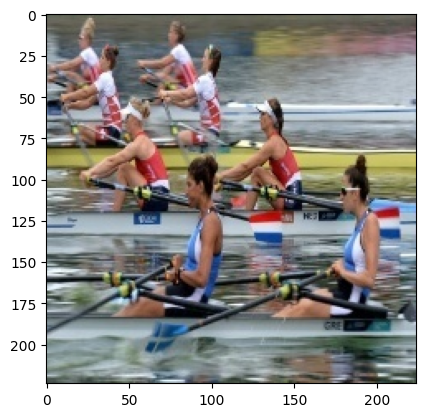

In [16]:
plt.imshow(train[0])
print(get_name(labels[0]))

In [17]:
pd.DataFrame(labels).value_counts()

,count
0,
5,458
1,400
3,240
2,202
0,196
4,185


In [18]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(train , labels, test_size = 0.2,stratify=labels,shuffle=True)

In [19]:
print ("x_train :" ,X_train.shape)



x_train : (1344, 224, 224, 3)


In [20]:
num_labels = len(np.unique(y_train))
num_labels

6

In [21]:
# Train labels
y_train=tf.keras.utils.to_categorical(y_train)
# Test labels
y_val=tf.keras.utils.to_categorical(y_val)

In [22]:
image_size=X_train.shape[1]
image_size

224

In [23]:
X_train,X_val=X_train/255.0,X_val/255.0

# **VGG 19**

In [24]:
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.models import Model

In [25]:
input_shape = (image_size, image_size, 3)
batch_size = 32

In [26]:
inputs=Input(shape=input_shape)

# Block 1
y = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
y = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(y)
y = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(y)

# Block 2
y = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(y)
y = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(y)
y = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(y)

# Block 3
y = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(y)
y = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(y)
y = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(y)
y = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv4')(y)
y = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(y)

# Block 4
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv4')(y)
y = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(y)

# Block 5
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(y)
y = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv4')(y)
y = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(y)
y = Flatten(name='flatten')(y)

# Create model.
model = Model(inputs=inputs, outputs=y)

In [27]:
#pre-trained VGG19 weights file without the fully connected layers, useful for transfer learning and feature extraction.
WEIGHTS_PATH_NO_TOP = '/content/drive/MyDrive/Sports_dataset/vgg19_weights_notop.h5'

In [28]:
WEIGHTS_PATH_NO_TOP = 'https://github.com/fchollet/deep-learning-models/releases/download/v0.1/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5'

In [29]:
from tensorflow.keras.utils import get_file # Import get_file from tensorflow.keras.utils
weights_path = get_file('vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5',
                                    WEIGHTS_PATH_NO_TOP,
                                    cache_subdir='models')
model.load_weights(weights_path)

In [30]:
model.trainable=False

In [31]:
model2 = tf.keras.Sequential([
        model,
#         tf.keras.layers.Dense(4096, activation = 'relu'),
#         tf.keras.layers.Dropout(0.5),
#         tf.keras.layers.Dense(4096, activation = 'relu'),
#         tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(num_labels, activation = 'softmax')
])

model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ functional (Functional)              │ (None, 25088)               │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 6)                   │         150,534 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,174,918 (76.96 MB)

 Trainable params: 150,534 (588.02 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [32]:
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [33]:
# data augumintation
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_generator = ImageDataGenerator(
    rotation_range=0.5,
    width_shift_range=0.2,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
)

In [34]:
# tf.random.set_seed(42)

Batch_size=32
Epochs=20

history = model2.fit(train_generator.flow(X_train,y_train
                                         ,batch_size=Batch_size),
                    epochs=Epochs,
                    validation_data=(X_val,y_val),
                    verbose=1)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


42/42 ━━━━━━━━━━━━━━━━━━━━ 1380s 33s/step - accuracy: 0.4229 - loss: 2.0012 - val_accuracy: 0.8279 - val_loss: 0.5062
Epoch 2/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1422s 33s/step - accuracy: 0.8117 - loss: 0.5270 - val_accuracy: 0.8872 - val_loss: 0.3486
Epoch 3/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1424s 34s/step - accuracy: 0.8583 - loss: 0.3965 - val_accuracy: 0.8724 - val_loss: 0.3656
Epoch 4/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1452s 34s/step - accuracy: 0.8929 - loss: 0.3173 - val_accuracy: 0.8783 - val_loss: 0.3863
Epoch 5/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1458s 34s/step - accuracy: 0.8959 - loss: 0.2975 - val_accuracy: 0.8961 - val_loss: 0.3142
Epoch 6/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1409s 34s/step - accuracy: 0.9406 - loss: 0.2028 - val_accuracy: 0.9021 - val_loss: 0.2701
Epoch 7/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1361s 32s/step - accuracy: 0.9408 - loss: 0.1660 - val_accuracy: 0.9228 - val_loss: 0.2875
Epoch 8/20
42/42 ━━━━━━━━━━━━━━━━━━━━ 1412s 34s/step - accuracy: 0.9406 - loss: 0.1680 - val_accuracy: 0.878

In [35]:
# Save the model to your Google Drive
model2.save('/content/drive/MyDrive/Sports_dataset/vgg19.h5')

In [ ]:
from keras.models import load_model

# Load the model from the .h5 file
model = load_model('/content/drive/MyDrive/Sports_dataset/vgg19.h5')

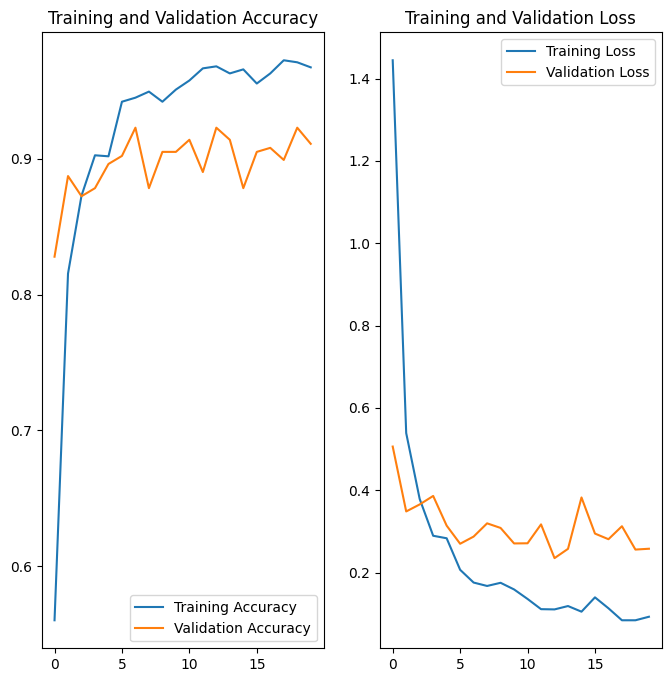

In [36]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

training_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs_range=range(Epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_accuracy, label='Training Accuracy')
plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, training_loss, label='Training Loss')
plt.plot(epochs_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [37]:
model2.evaluate(X_val,y_val)

11/11 ━━━━━━━━━━━━━━━━━━━━ 285s 25s/step - accuracy: 0.9357 - loss: 0.1906


[0.2580200433731079, 0.9109792113304138]

In [44]:
score=model2.evaluate(X_val,y_val,batch_size=batch_size,verbose=0)
print("Test accuracy: %.1f%%" % (100.0 * score[1]))

Test accuracy: 91.1%


11/11 ━━━━━━━━━━━━━━━━━━━━ 270s 24s/step


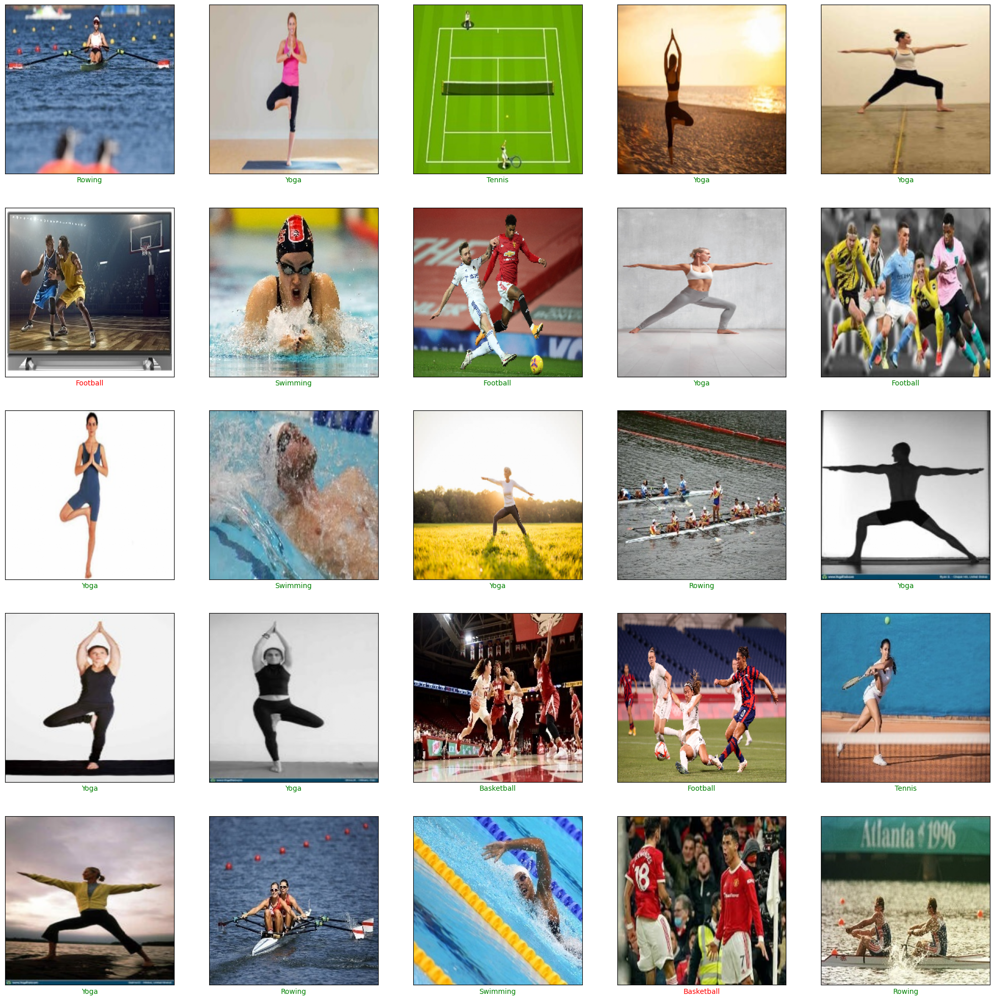

In [38]:
#pred
p=model2.predict(X_val)

plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_val[50+i])
    color = 'green' if get_name(np.argmax(p[50+i])) == get_name(np.argmax(y_val[50+i])) else 'red'
    plt.xlabel(get_name(np.argmax(p[50+i])),color=color)
plt.show()

In [39]:
#reading test data
l_test=reading_resize(test_imgs,test_path,image_size)

In [40]:
test = np.array(l_test)
print(test.shape)

(688, 224, 224, 3)


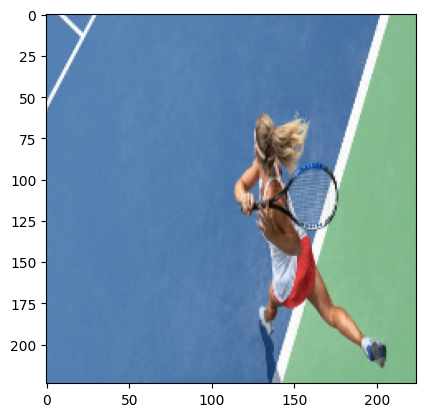

In [41]:
plt.imshow(test[200])

In [42]:
test_names=[]
for g in test_imgs:
    test_names.append(g)

In [43]:
#normalize
test=test/255.0

In [45]:
test_out=model2.predict(test)

22/22 ━━━━━━━━━━━━━━━━━━━━ 549s 25s/step


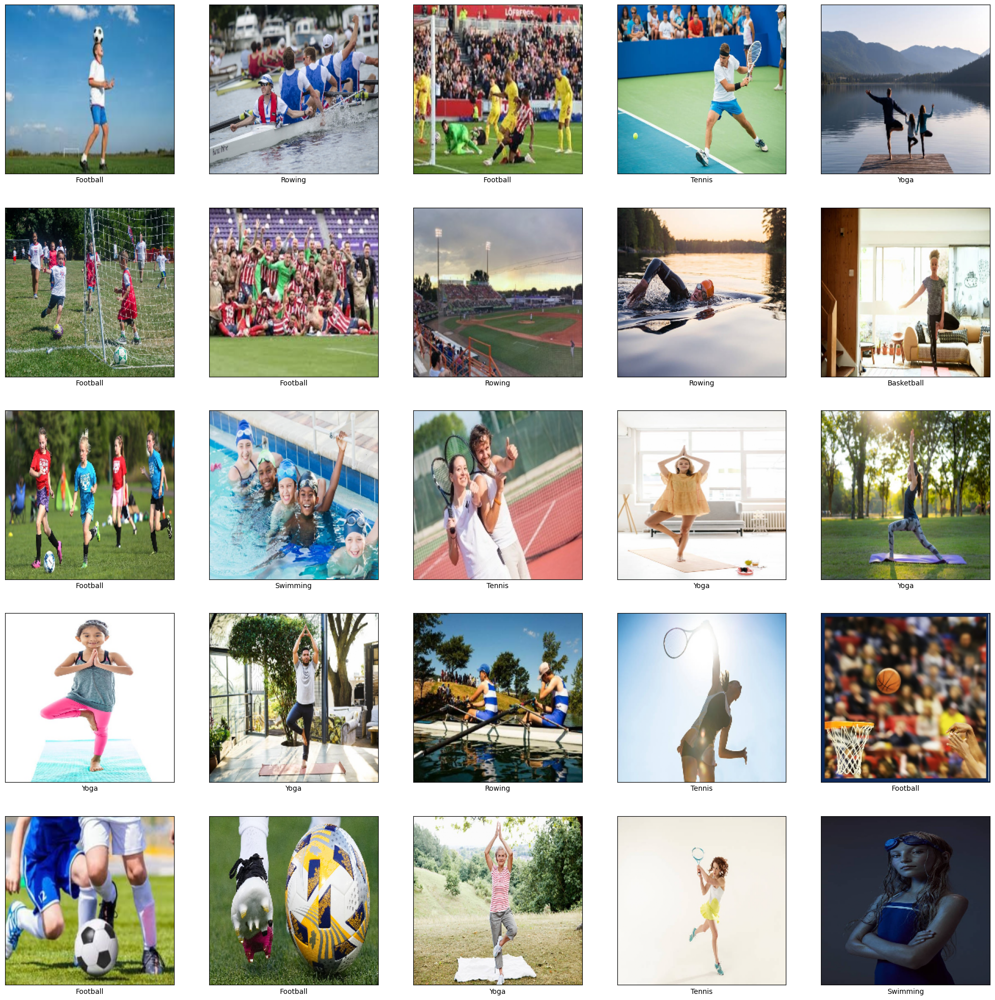

In [46]:
#pred
p=test_out

plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test[i])
    plt.xlabel(get_name(np.argmax(p[i])))
plt.show()

In [47]:
pred_out=[]
for i in range(len(test_out)):
    label=np.argmax(test_out[i])
    pred_out.append([test_names[i],label])

pred_out

[['111.jpg', 1],
 ['112.jpg', 2],
 ['106.jpg', 1],
 ['0.jpg', 4],
 ['10.jpg', 5],
 ['102.jpg', 1],
 ['101.jpg', 1],
 ['107.jpg', 2],
 ['114.jpg', 2],
 ['113.jpg', 0],
 ['108.jpg', 1],
 ['110.jpg', 3],
 ['1.jpg', 4],
 ['105.jpg', 5],
 ['100.jpg', 5],
 ['11.jpg', 5],
 ['104.jpg', 5],
 ['103.jpg', 2],
 ['109.jpg', 4],
 ['115.jpg', 1],
 ['144.jpg', 1],
 ['139.jpg', 1],
 ['16.jpg', 5],
 ['143.jpg', 4],
 ['117.jpg', 3],
 ['132.jpg', 1],
 ['154.jpg', 3],
 ['126.jpg', 5],
 ['156.jpg', 2],
 ['165.jpg', 5],
 ['116.jpg', 4],
 ['12.jpg', 3],
 ['163.jpg', 5],
 ['142.jpg', 0],
 ['150.jpg', 2],
 ['127.jpg', 5],
 ['145.jpg', 5],
 ['146.jpg', 1],
 ['141.jpg', 1],
 ['118.jpg', 5],
 ['167.jpg', 2],
 ['149.jpg', 4],
 ['151.jpg', 5],
 ['162.jpg', 1],
 ['123.jpg', 2],
 ['147.jpg', 3],
 ['159.jpg', 3],
 ['119.jpg', 1],
 ['135.jpg', 3],
 ['155.jpg', 1],
 ['166.jpg', 1],
 ['122.jpg', 1],
 ['160.jpg', 2],
 ['128.jpg', 1],
 ['169.jpg', 1],
 ['15.jpg', 4],
 ['130.jpg', 2],
 ['131.jpg', 5],
 ['17.jpg', 3],
 ['14.j